In [1]:
import pandas as pd

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('seaborn')
mpl.rcParams['font.family']='serif'
%matplotlib inline

In [3]:
filename="/data/startup_funding.csv"

In [4]:
df=pd.read_csv(filename,index_col=0,parse_dates=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3044 entries, 1 to 3044
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Date dd/mm/yyyy    3044 non-null   object
 1   Startup Name       3044 non-null   object
 2   Industry Vertical  2873 non-null   object
 3   SubVertical        2108 non-null   object
 4   City  Location     2864 non-null   object
 5   Investors Name     3020 non-null   object
 6   InvestmentnType    3040 non-null   object
 7   Amount in USD      2084 non-null   object
 8   Remarks            419 non-null    object
dtypes: object(9)
memory usage: 237.8+ KB


In [7]:
df.describe()

,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
count,3044,3044,2873,2108,2864,3020,3040,2084,419
unique,1035,2459,821,1942,112,2412,55,471,72
top,02/02/2015,Ola Cabs,Consumer Internet,Online Lending Platform,Bangalore,Undisclosed Investors,Private Equity,"10,00,000",Series A
freq,11,8,941,11,700,39,1356,165,175


In [8]:
df.drop_duplicates(inplace=True)

In [9]:
df

,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
Sr No,,,,,,,,,
1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000",NaN
2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394",NaN
3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,"1,83,58,860",NaN
4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,"30,00,000",NaN
5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,"18,00,000",NaN
...,...,...,...,...,...,...,...,...,...
3040,29/01/2015,Printvenue,NaN,NaN,NaN,Asia Pacific Internet Group,Private Equity,"45,00,000",NaN
3041,29/01/2015,Graphene,NaN,NaN,NaN,KARSEMVEN Fund,Private Equity,"8,25,000",Govt backed VC Fund
3042,30/01/2015,Mad Street Den,NaN,NaN,NaN,"Exfinity Fund, GrowX Ventures.",Private Equity,"15,00,000",NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3044 entries, 1 to 3044
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Date dd/mm/yyyy    3044 non-null   object
 1   Startup Name       3044 non-null   object
 2   Industry Vertical  2873 non-null   object
 3   SubVertical        2108 non-null   object
 4   City  Location     2864 non-null   object
 5   Investors Name     3020 non-null   object
 6   InvestmentnType    3040 non-null   object
 7   Amount in USD      2084 non-null   object
 8   Remarks            419 non-null    object
dtypes: object(9)
memory usage: 237.8+ KB


In [11]:
df.describe()

,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
count,3044,3044,2873,2108,2864,3020,3040,2084,419
unique,1035,2459,821,1942,112,2412,55,471,72
top,02/02/2015,Ola Cabs,Consumer Internet,Online Lending Platform,Bangalore,Undisclosed Investors,Private Equity,"10,00,000",Series A
freq,11,8,941,11,700,39,1356,165,175


In [15]:
df.groupby('City  Location')['Amount in USD'].sum().sort_values(ascending=False)

TypeError: '<' not supported between instances of 'int' and 'str'

In [16]:
df['Amount in USD'] = df['Amount in USD'].replace({'Undisclosed': None, 'N/A': None, 'nan': None})
df['Amount in USD'] = df['Amount in USD'].str.replace(',', '')
df['Amount in USD'] = pd.to_numeric(df['Amount in USD'], errors='coerce')


In [19]:
data=df.groupby('City  Location')['Amount in USD'].sum().sort_values(ascending=False)

In [18]:
df

,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
Sr No,,,,,,,,,
1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,200000000.0,NaN
2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8048394.0,NaN
3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,18358860.0,NaN
4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3000000.0,NaN
5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1800000.0,NaN
...,...,...,...,...,...,...,...,...,...
3040,29/01/2015,Printvenue,NaN,NaN,NaN,Asia Pacific Internet Group,Private Equity,4500000.0,NaN
3041,29/01/2015,Graphene,NaN,NaN,NaN,KARSEMVEN Fund,Private Equity,825000.0,Govt backed VC Fund
3042,30/01/2015,Mad Street Den,NaN,NaN,NaN,"Exfinity Fund, GrowX Ventures.",Private Equity,1500000.0,NaN


<AxesSubplot:xlabel='City  Location'>

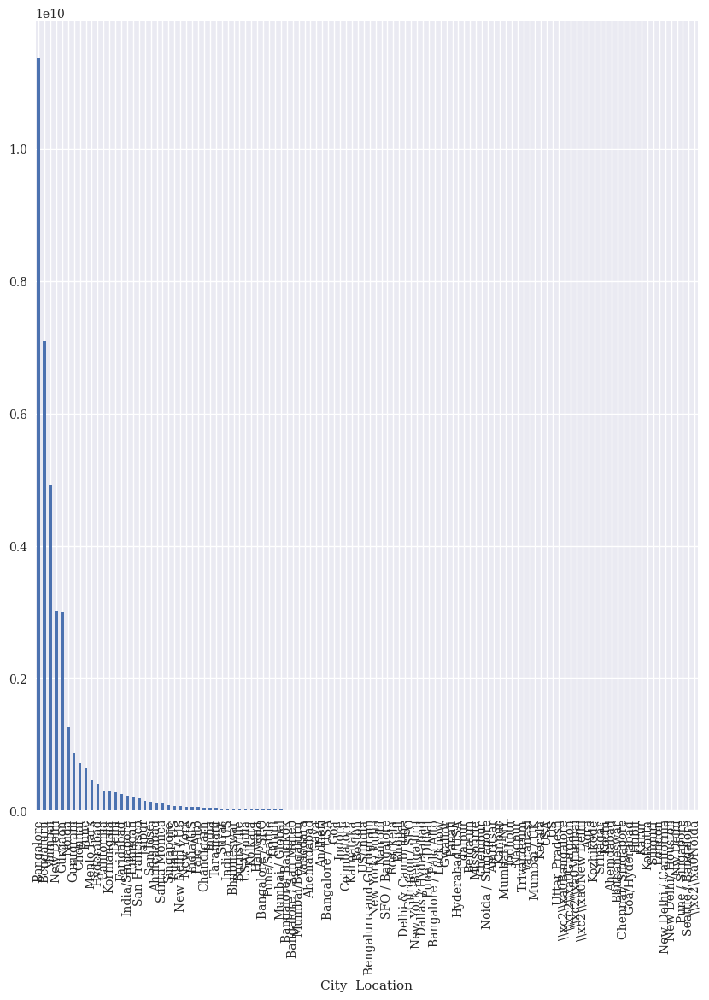

In [21]:
data.plot(kind='bar',figsize=(10, 12))

In [22]:
df.columns = df.columns.str.strip().str.replace(" ", "_").str.lower()

In [23]:
df

,date_dd/mm/yyyy,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks
Sr No,,,,,,,,,
1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,200000000.0,NaN
2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8048394.0,NaN
3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,18358860.0,NaN
4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3000000.0,NaN
5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1800000.0,NaN
...,...,...,...,...,...,...,...,...,...
3040,29/01/2015,Printvenue,NaN,NaN,NaN,Asia Pacific Internet Group,Private Equity,4500000.0,NaN
3041,29/01/2015,Graphene,NaN,NaN,NaN,KARSEMVEN Fund,Private Equity,825000.0,Govt backed VC Fund
3042,30/01/2015,Mad Street Den,NaN,NaN,NaN,"Exfinity Fund, GrowX Ventures.",Private Equity,1500000.0,NaN


In [25]:
# Replace garbage text values
df['amount_in_usd'] = df['amount_in_usd'].replace({'Undisclosed': None, 'N/A': None})

# Remove commas safely
df['amount_in_usd'] = df['amount_in_usd'].astype(str).str.replace(',', '')

# Convert to float
df['amount_in_usd'] = pd.to_numeric(df['amount_in_usd'], errors='coerce')

In [27]:
df.rename(columns={'date_dd/mm/yyyy': 'date'}, inplace=True)
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['year'] = df['date'].dt.year

In [29]:
df.drop_duplicates(subset=['startup_name', 'date', 'amount_in_usd'], inplace=True)

In [30]:
df

,date,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,year
Sr No,,,,,,,,,,
1,2020-09-01,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,200000000.0,NaN,2020.0
2,2020-01-13,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8048394.0,NaN,2020.0
3,2020-09-01,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,18358860.0,NaN,2020.0
4,2020-02-01,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3000000.0,NaN,2020.0
5,2020-02-01,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1800000.0,NaN,2020.0
...,...,...,...,...,...,...,...,...,...,...
3040,2015-01-29,Printvenue,NaN,NaN,NaN,Asia Pacific Internet Group,Private Equity,4500000.0,NaN,2015.0
3041,2015-01-29,Graphene,NaN,NaN,NaN,KARSEMVEN Fund,Private Equity,825000.0,Govt backed VC Fund,2015.0
3042,2015-01-30,Mad Street Den,NaN,NaN,NaN,"Exfinity Fund, GrowX Ventures.",Private Equity,1500000.0,NaN,2015.0


In [35]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns',None)

In [36]:
df

,date,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,year
Sr No,,,,,,,,,,
1,2020-09-01,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,2.000000e+08,NaN,2020.0
2,2020-01-13,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8.048394e+06,NaN,2020.0
3,2020-09-01,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,1.835886e+07,NaN,2020.0
4,2020-02-01,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3.000000e+06,NaN,2020.0
5,2020-02-01,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1.800000e+06,NaN,2020.0
6,2020-01-13,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9.000000e+06,NaN,2020.0
7,2020-10-01,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,1.500000e+08,NaN,2020.0
8,2019-12-12,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6.000000e+06,NaN,2019.0
9,2019-06-12,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,7.000000e+07,NaN,2019.0


In [43]:
df.tail()

,date,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,year
Sr No,,,,,,,,,,


In [42]:
df

,date,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,year
Sr No,,,,,,,,,,


In [40]:
print("Before:", df.shape)
df.dropna(inplace=True)
print("After:", df.shape)

Before: (0, 10)
After: (0, 10)


In [44]:
df = pd.read_csv('/data/startup_funding.csv')

In [45]:
df

,Sr No,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
0,1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000",NaN
1,2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394",NaN
2,3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,"1,83,58,860",NaN
3,4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,"30,00,000",NaN
4,5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,"18,00,000",NaN
5,6,13/01/2020,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,"90,00,000",NaN
6,7,10/01/2020,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,"15,00,00,000",NaN
7,8,12/12/2019,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,"60,00,000",NaN
8,9,06/12/2019,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,"7,00,00,000",NaN
9,10,03/12/2019,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,"5,00,00,000",NaN


In [46]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')


In [47]:
df['amount_in_usd'] = df['amount_in_usd'].replace({'Undisclosed': None, 'N/A': None})

In [48]:
df['amount_in_usd'] = df['amount_in_usd'].astype(str).str.replace(',', '')
df['amount_in_usd'] = pd.to_numeric(df['amount_in_usd'], errors='coerce')


In [49]:
df['date'] = pd.to_datetime(df['date_dd/mm/yyyy'], dayfirst=True, errors='coerce')


In [50]:
df['year'] = df['date'].dt.year


In [51]:
df.drop_duplicates(subset=['startup_name', 'date', 'amount_in_usd'], inplace=True)

In [52]:
df.dropna(subset=['date', 'amount_in_usd'], inplace=True)

In [56]:
df['industry_vertical'] = df['industry_vertical'].fillna('Unknown')
df['city_location'] = df['city__location'].fillna('Unknown')

In [58]:
df.reset_index(drop=True, inplace=True)

In [61]:
df.drop('sr_no', axis=1, inplace=True)

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2062 entries, 0 to 2061
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   date_dd/mm/yyyy    2062 non-null   object        
 1   startup_name       2062 non-null   object        
 2   industry_vertical  2062 non-null   object        
 3   subvertical        1417 non-null   object        
 4   city__location     1928 non-null   object        
 5   investors_name     2042 non-null   object        
 6   investmentntype    2059 non-null   object        
 7   amount_in_usd      2062 non-null   float64       
 8   remarks            337 non-null    object        
 9   date               2062 non-null   datetime64[ns]
 10  year               2062 non-null   float64       
 11  city_location      2062 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(9)
memory usage: 193.4+ KB


In [64]:
# Drop the 'date_dd/mm/yyyy' column inplace
df.drop('date_dd/mm/yyyy', axis=1, inplace=True)

# Create a list of columns with 'date' and 'year' first, then the rest
cols = ['date', 'year'] + [col for col in df.columns if col not in ['date', 'year']]

# Reorder the dataframe columns
df = df[cols]


In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2062 entries, 0 to 2061
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   date               2062 non-null   datetime64[ns]
 1   year               2062 non-null   float64       
 2   startup_name       2062 non-null   object        
 3   industry_vertical  2062 non-null   object        
 4   subvertical        2062 non-null   object        
 5   city__location     2062 non-null   object        
 6   investors_name     2062 non-null   object        
 7   investment_type    2062 non-null   object        
 8   amount_in_usd      2062 non-null   int64         
 9   remarks            2062 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(7)
memory usage: 177.2+ KB


In [66]:
import re

pattern = r'(https?://|www\.|\.com|\.in|Pvt\. Ltd|Pvt Ltd|Ltd\.|Ltd)'

df['startup_name_clean'] = df['startup_name'].str.replace(pattern, '', flags=re.IGNORECASE, regex=True).str.strip()

/opt/conda/envs/py4fi/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [67]:
df

,date,year,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,city_location,startup_name_clean
0,2020-01-09,2020.0,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,2.000000e+08,NaN,Bengaluru,BYJU’S
1,2020-01-13,2020.0,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8.048394e+06,NaN,Gurgaon,Shuttl
2,2020-01-09,2020.0,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,1.835886e+07,NaN,Bengaluru,Mamaearth
3,2020-01-02,2020.0,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3.000000e+06,NaN,New Delhi,wealthbucket/
4,2020-01-02,2020.0,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1.800000e+06,NaN,Mumbai,Fashor
5,2020-01-13,2020.0,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9.000000e+06,NaN,Chennai,Pando
6,2020-01-10,2020.0,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,1.500000e+08,NaN,Gurgaon,Zomato
7,2019-12-12,2019.0,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6.000000e+06,NaN,Pune,Ecozen
8,2019-12-06,2019.0,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,7.000000e+07,NaN,Gurgaon,CarDekho
9,2019-12-03,2019.0,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,5.000000e+07,NaN,Bengaluru,Dhruva Space


In [68]:
df.loc[:, 'startup_name'] = df['startup_name'].str.replace(pattern, '', flags=re.IGNORECASE, regex=True).str.strip()

/opt/conda/envs/py4fi/lib/python3.7/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [69]:
df = df.copy()  # this will avoid the warning if df was originally a slice


In [70]:
df.loc[:, 'startup_name'] = df['startup_name'].str.replace(pattern, '', flags=re.IGNORECASE, regex=True).str.strip()


In [71]:
df

,date,year,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,city_location,startup_name_clean
0,2020-01-09,2020.0,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,2.000000e+08,NaN,Bengaluru,BYJU’S
1,2020-01-13,2020.0,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8.048394e+06,NaN,Gurgaon,Shuttl
2,2020-01-09,2020.0,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,1.835886e+07,NaN,Bengaluru,Mamaearth
3,2020-01-02,2020.0,wealthbucket/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3.000000e+06,NaN,New Delhi,wealthbucket/
4,2020-01-02,2020.0,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1.800000e+06,NaN,Mumbai,Fashor
5,2020-01-13,2020.0,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9.000000e+06,NaN,Chennai,Pando
6,2020-01-10,2020.0,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,1.500000e+08,NaN,Gurgaon,Zomato
7,2019-12-12,2019.0,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6.000000e+06,NaN,Pune,Ecozen
8,2019-12-06,2019.0,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,7.000000e+07,NaN,Gurgaon,CarDekho
9,2019-12-03,2019.0,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,5.000000e+07,NaN,Bengaluru,Dhruva Space


In [72]:
import re

# Ensure it's a full DataFrame and not a slice
df = df.copy()

# 1. Replace dots (.) with space
# 2. Replace backslashes (\), quotes (' or ") with nothing
# 3. Replace multiple spaces with a single space and strip leading/trailing spaces
df['startup_name'] = (
    df['startup_name']
    .str.replace(r'\.', ' ', regex=True)           # Replace dots with space
    .str.replace(r'[\\\'\"]', '', regex=True)      # Remove \, ', "
    .str.replace(r'\s+', ' ', regex=True)          # Replace multiple spaces with single space
    .str.strip()                                   # Strip leading/trailing spaces
)

In [73]:
df

,date,year,startup_name,industry_vertical,subvertical,city__location,investors_name,investmentntype,amount_in_usd,remarks,city_location,startup_name_clean
0,2020-01-09,2020.0,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,2.000000e+08,NaN,Bengaluru,BYJU’S
1,2020-01-13,2020.0,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8.048394e+06,NaN,Gurgaon,Shuttl
2,2020-01-09,2020.0,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,1.835886e+07,NaN,Bengaluru,Mamaearth
3,2020-01-02,2020.0,wealthbucket/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3.000000e+06,NaN,New Delhi,wealthbucket/
4,2020-01-02,2020.0,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1.800000e+06,NaN,Mumbai,Fashor
5,2020-01-13,2020.0,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9.000000e+06,NaN,Chennai,Pando
6,2020-01-10,2020.0,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,1.500000e+08,NaN,Gurgaon,Zomato
7,2019-12-12,2019.0,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6.000000e+06,NaN,Pune,Ecozen
8,2019-12-06,2019.0,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,7.000000e+07,NaN,Gurgaon,CarDekho
9,2019-12-03,2019.0,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,5.000000e+07,NaN,Bengaluru,Dhruva Space


In [74]:
df = df.rename(columns={'investmentntype': 'investment_type'})

In [75]:
df['amount_in_usd'] = df['amount_in_usd'].apply(lambda x: f"{x:.0f}" if pd.notnull(x) else x)

In [76]:
df.drop(columns=['city_location', 'startup_name_clean'], inplace=True)

In [77]:
df

,date,year,startup_name,industry_vertical,subvertical,city__location,investors_name,investment_type,amount_in_usd,remarks
0,2020-01-09,2020.0,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,200000000,NaN
1,2020-01-13,2020.0,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8048394,NaN
2,2020-01-09,2020.0,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,18358860,NaN
3,2020-01-02,2020.0,wealthbucket/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3000000,NaN
4,2020-01-02,2020.0,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1800000,NaN
5,2020-01-13,2020.0,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9000000,NaN
6,2020-01-10,2020.0,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,150000000,NaN
7,2019-12-12,2019.0,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6000000,NaN
8,2019-12-06,2019.0,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,70000000,NaN
9,2019-12-03,2019.0,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,50000000,NaN


In [119]:
df.fillna(' ', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2062 entries, 0 to 2061
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   date               2062 non-null   datetime64[ns]
 1   year               2062 non-null   float64       
 2   startup_name       2062 non-null   object        
 3   industry_vertical  2062 non-null   object        
 4   subvertical        2062 non-null   object        
 5   city__location     2062 non-null   object        
 6   investors_name     2062 non-null   object        
 7   investment_type    2062 non-null   object        
 8   amount_in_usd      2062 non-null   int64         
 9   remarks            2062 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(7)
memory usage: 177.2+ KB


In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")  # clean and professional style
plt.rcParams['figure.figsize'] = (12, 6)


ModuleNotFoundError: No module named 'seaborn'

In [82]:
pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 1.3 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [83]:
df.to_csv('/mnt/data/cleaned_startup_data.csv', index=False)

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/cleaned_startup_data.csv'

In [84]:
import cufflinks as cf
import plotly.offline as py

py.init_notebook_mode(connected=True)
cf.go_offline()

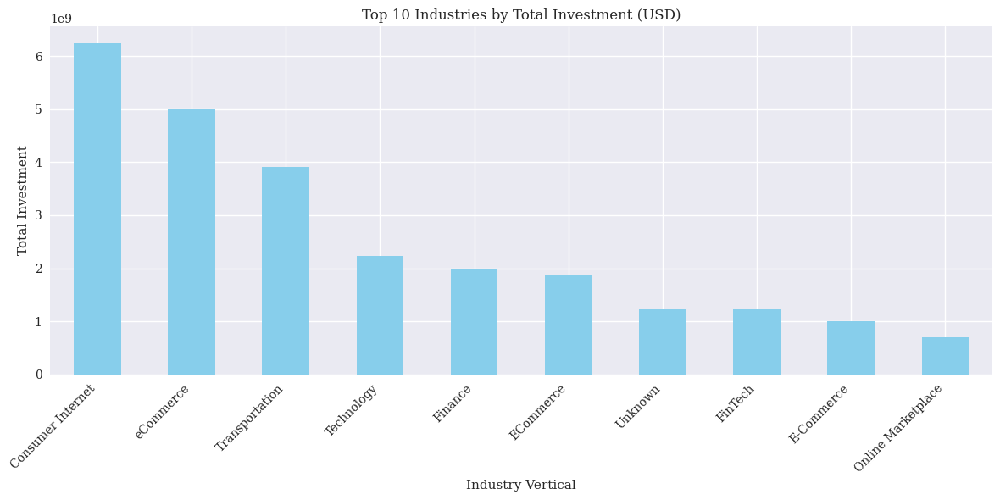

industry_vertical
Consumer Internet     6246834245
eCommerce             5002533000
Transportation        3916632394
Technology            2229707930
Finance               1971438000
ECommerce             1878797608
Unknown               1231611368
FinTech               1220711265
E-Commerce            1008110065
Online Marketplace     700143000
Name: amount_in_usd, dtype: int64

In [120]:
import matplotlib.pyplot as plt

# Group by industry_vertical and sum amount_in_usd
industry_investment = df.groupby('industry_vertical')['amount_in_usd'].sum().sort_values(ascending=False).head(10)

# Plot bar chart
plt.figure(figsize=(12,6))
industry_investment.plot(kind='bar', color='skyblue')
plt.title('Top 10 Industries by Total Investment (USD)')
plt.ylabel('Total Investment')
plt.xlabel('Industry Vertical')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
industry_investment

In [86]:
print(df['amount_in_usd'].dtype)

object


In [87]:
df['amount_in_usd'] = pd.to_numeric(df['amount_in_usd'], errors='coerce')

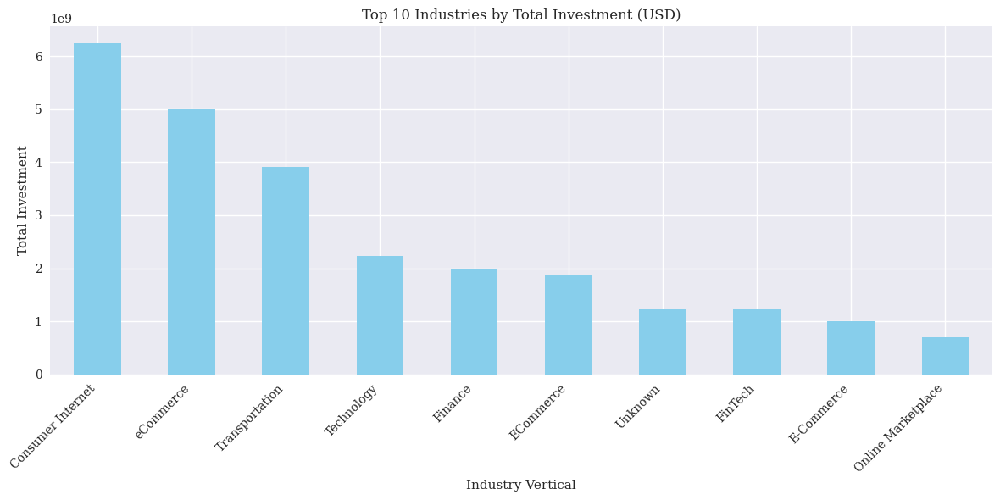

In [88]:
industry_investment = df.groupby('industry_vertical')['amount_in_usd'].sum().sort_values(ascending=False).head(10)

# Plot bar chart
plt.figure(figsize=(12,6))
industry_investment.plot(kind='bar', color='skyblue')
plt.title('Top 10 Industries by Total Investment (USD)')
plt.ylabel('Total Investment')
plt.xlabel('Industry Vertical')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

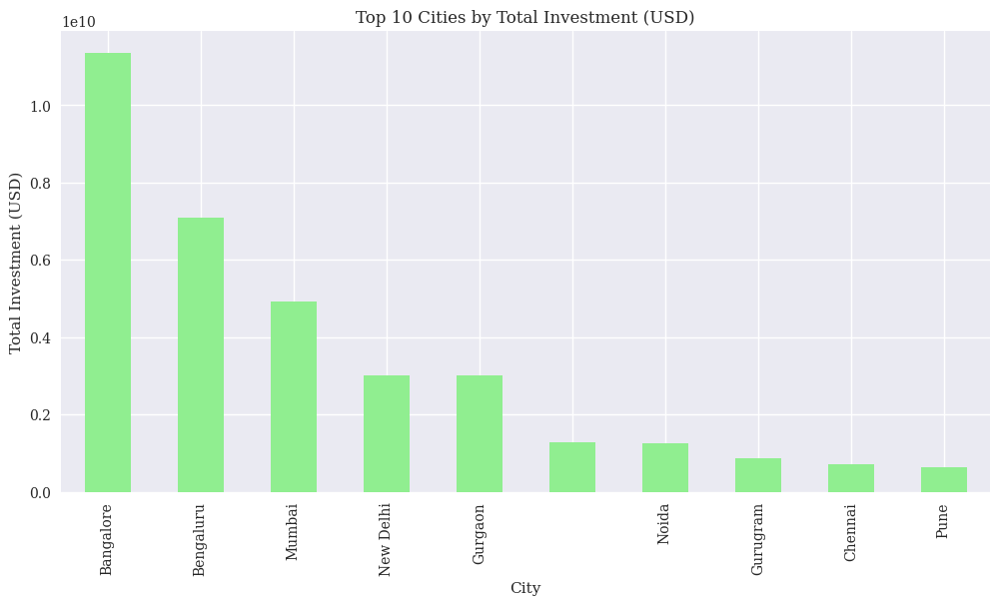

city__location
Bangalore    11361588108
Bengaluru     7098578755
Mumbai        4914305015
New Delhi     3017816875
Gurgaon       3005296135
              1271663868
Noida         1262864000
Gurugram       865932523
Chennai        718767000
Pune           633082000
Name: amount_in_usd, dtype: int64

In [123]:
city_investment = df.groupby('city__location')['amount_in_usd'].sum().sort_values(ascending=False).head(10)

city_investment.plot(kind='bar', color='lightgreen', figsize=(12,6))
plt.title('Top 10 Cities by Total Investment (USD)')
plt.ylabel('Total Investment (USD)')
plt.xlabel('City')
plt.show()

city_investment

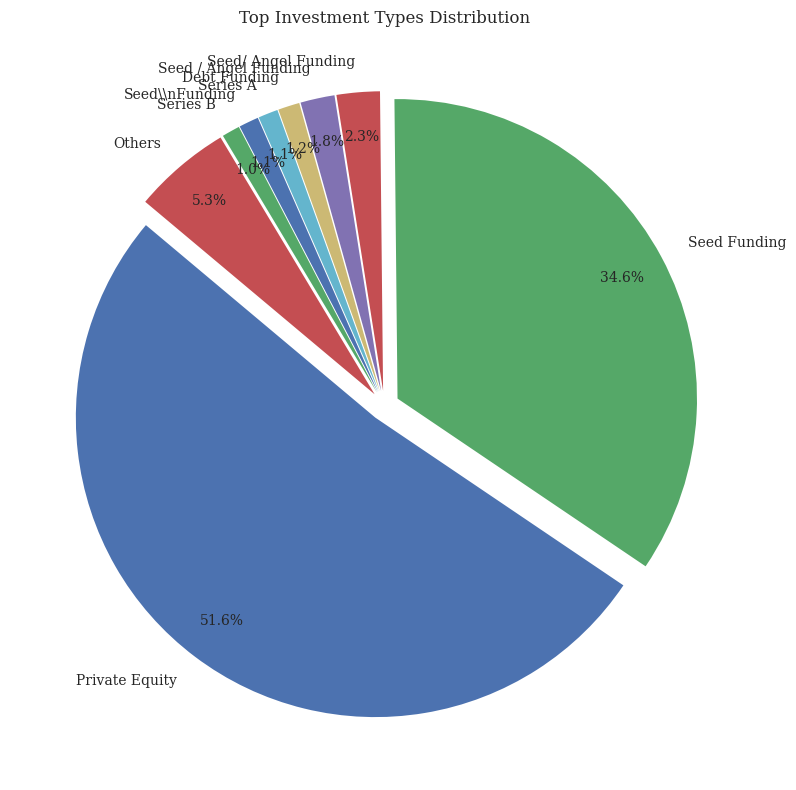

Private Equity          1065
Seed Funding             714
Seed/ Angel Funding       48
Seed / Angel Funding      38
Debt Funding              24
Series A                  22
Seed\\nFunding            22
Series B                  20
Others                   109
Name: investment_type, dtype: int64

In [124]:
investment_col = 'investment_type'
investment_counts = df[investment_col].value_counts()

# Limit to top 8, group rest as 'Others'
top_n = 8
top_investments = investment_counts.head(top_n)
others_sum = investment_counts.iloc[top_n:].sum()
top_investments['Others'] = others_sum

# Explode all slices slightly
explode = [0.05] * len(top_investments)

# Plot
plt.figure(figsize=(10,8))
plt.pie(
    top_investments,
    labels=top_investments.index,
    autopct='%1.1f%%',
    startangle=140,
    explode=explode,
    pctdistance=0.85,
    labeldistance=1.1
)
plt.title('Top Investment Types Distribution')
plt.tight_layout()
plt.show()

top_investments

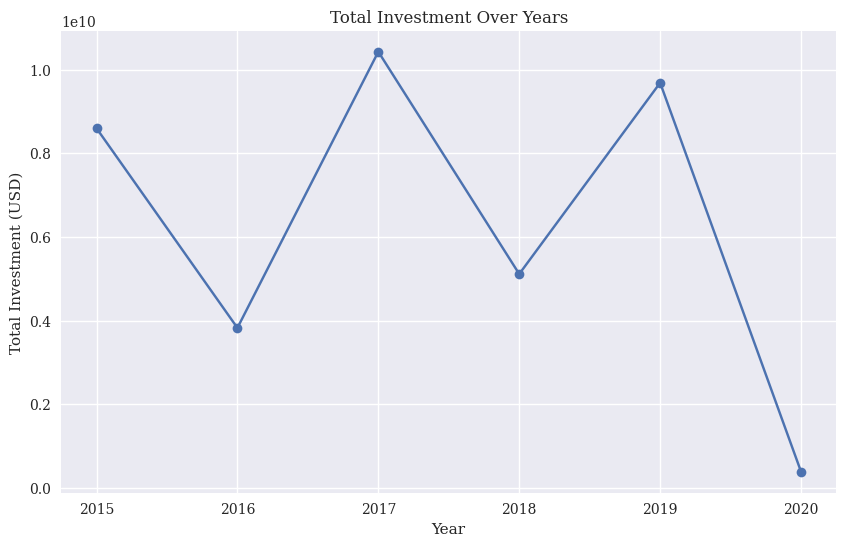

year
2015.0     8600357368
2016.0     3828088608
2017.0    10429309730
2018.0     5116118369
2019.0     9686576536
2020.0      390207254
Name: amount_in_usd, dtype: int64

In [125]:
yearly_investment = df.groupby('year')['amount_in_usd'].sum()

yearly_investment.plot(kind='line', marker='o', figsize=(10,6))
plt.title('Total Investment Over Years')
plt.ylabel('Total Investment (USD)')
plt.xlabel('Year')
plt.grid(True)
plt.show()

yearly_investment


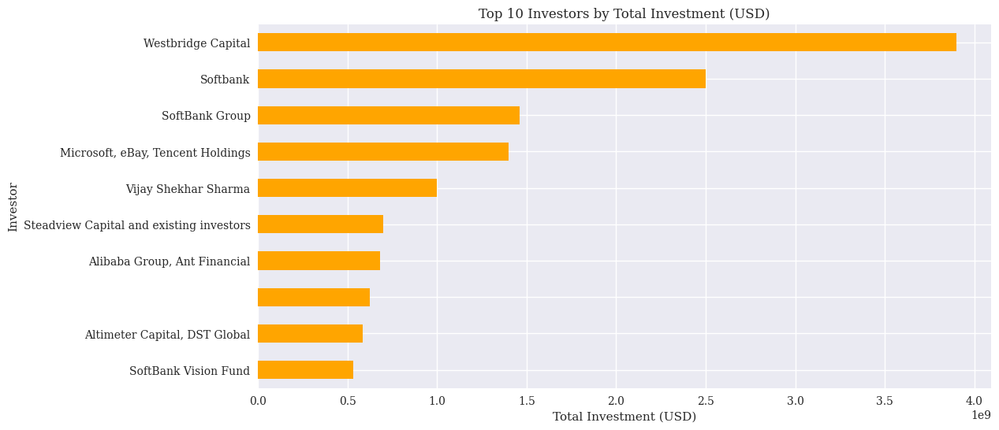

investors_name
Westbridge Capital                          3900000000
Softbank                                    2500000000
SoftBank Group                              1462000000
Microsoft, eBay, Tencent Holdings           1400000000
Vijay Shekhar Sharma                        1000150000
Steadview Capital and existing investors     700000000
Alibaba Group, Ant Financial                 680000000
                                             624105951
Altimeter Capital, DST Global                585000000
SoftBank Vision Fund                         531000000
Name: amount_in_usd, dtype: int64

In [126]:
investor_investment = df.groupby('investors_name')['amount_in_usd'].sum().sort_values(ascending=False).head(10)

investor_investment.plot(kind='barh', color='orange', figsize=(12,6))
plt.title('Top 10 Investors by Total Investment (USD)')
plt.xlabel('Total Investment (USD)')
plt.ylabel('Investor')
plt.gca().invert_yaxis()  # largest on top
plt.show()

investor_investment

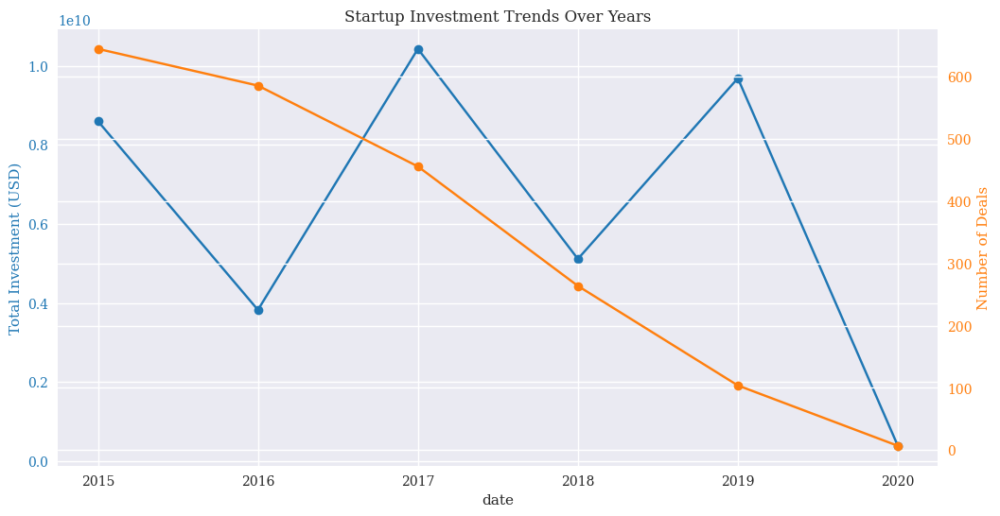

date
2015     8600357368
2016     3828088608
2017    10429309730
2018     5116118369
2019     9686576536
2020      390207254
Name: amount_in_usd, dtype: int64

In [132]:
import matplotlib.pyplot as plt

# Make sure your date column is datetime
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# Drop rows where date conversion failed if any
df = df.dropna(subset=['date'])

# Group by year
yearly_investments = df.groupby(df['date'].dt.year)['amount_in_usd'].sum()
yearly_deals = df.groupby(df['date'].dt.year).size()

fig, ax1 = plt.subplots(figsize=(12,6))

ax1.set_xlabel('Year')
ax1.set_ylabel('Total Investment (USD)', color='tab:blue')
yearly_investments.plot(kind='line', marker='o', ax=ax1, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('Number of Deals', color='tab:orange')
yearly_deals.plot(kind='line', marker='o', ax=ax2, color='tab:orange')
ax2.tick_params(axis='y', labelcolor='tab:orange')

plt.title('Startup Investment Trends Over Years')
plt.show()


yearly_investments

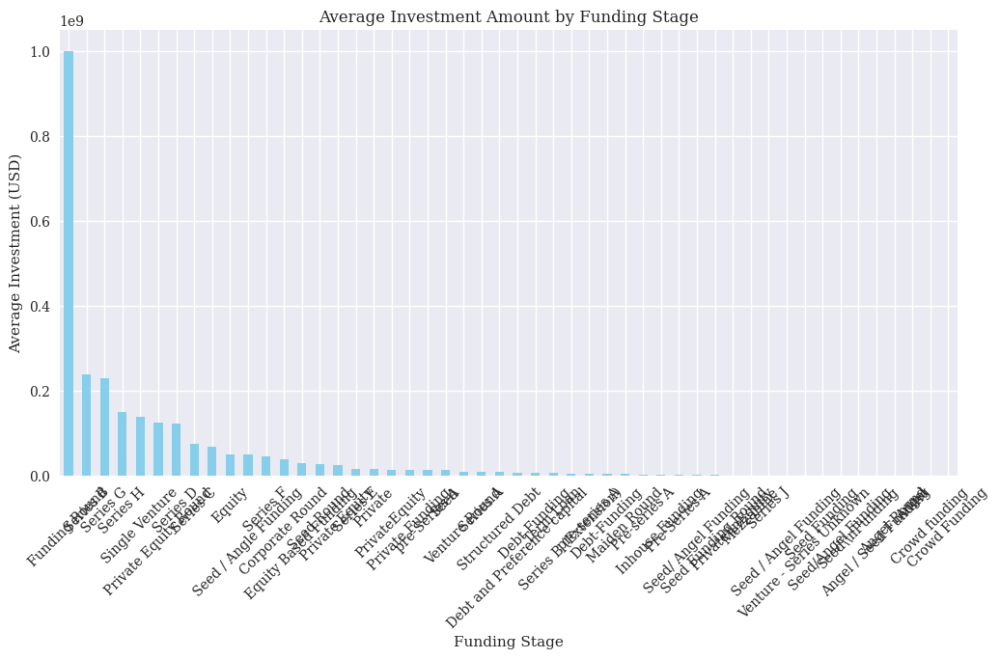

In [99]:
plt.figure(figsize=(12,6))

avg_investment_by_stage = df.groupby('investment_type')['amount_in_usd'].mean().sort_values(ascending=False)

avg_investment_by_stage.plot(kind='bar', color='skyblue')
plt.title('Average Investment Amount by Funding Stage')
plt.ylabel('Average Investment (USD)')
plt.xlabel('Funding Stage')
plt.xticks(rotation=45)
plt.show()

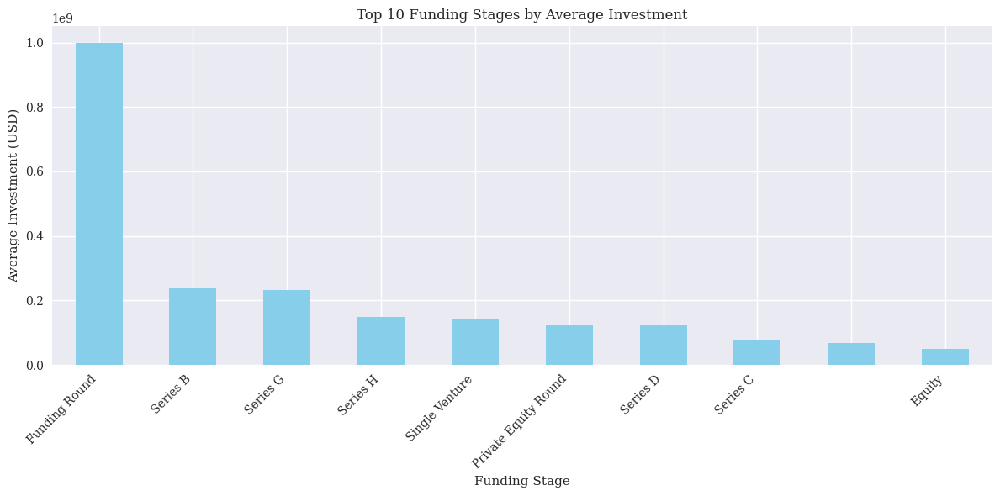

investment_type
Funding Round           1.000000e+09
Series B                2.399598e+08
Series G                2.310000e+08
Series H                1.500000e+08
Single Venture          1.400000e+08
Private Equity Round    1.265000e+08
Series D                1.234832e+08
Series C                7.462274e+07
                        6.920967e+07
Equity                  5.050000e+07
Name: amount_in_usd, dtype: float64

In [133]:
plt.figure(figsize=(12,6))

top_n = 10
avg_top_stages = avg_investment_by_stage.head(top_n)

avg_top_stages.plot(kind='bar', color='skyblue')
plt.title(f'Top {top_n} Funding Stages by Average Investment')
plt.ylabel('Average Investment (USD)')
plt.xlabel('Funding Stage')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

avg_top_stages

In [102]:
df

,date,year,startup_name,industry_vertical,subvertical,city__location,investors_name,investment_type,amount_in_usd,remarks
0,2020-01-09,2020.0,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,200000000,
1,2020-01-13,2020.0,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,8048394,
2,2020-01-09,2020.0,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,18358860,
3,2020-01-02,2020.0,wealthbucket/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,3000000,
4,2020-01-02,2020.0,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,1800000,
5,2020-01-13,2020.0,Pando,Logistics,"Open-market, freight management platform",Chennai,Chiratae Ventures,Series A,9000000,
6,2020-01-10,2020.0,Zomato,Hospitality,Online Food Delivery Platform,Gurgaon,Ant Financial,Private Equity Round,150000000,
7,2019-12-12,2019.0,Ecozen,Technology,Agritech,Pune,Sathguru Catalyzer Advisors,Series A,6000000,
8,2019-12-06,2019.0,CarDekho,E-Commerce,Automobile,Gurgaon,Ping An Global Voyager Fund,Series D,70000000,
9,2019-12-03,2019.0,Dhruva Space,Aerospace,Satellite Communication,Bengaluru,"Mumbai Angels, Ravikanth Reddy",Seed,50000000,


Index(['date', 'year', 'startup_name', 'industry_vertical', 'subvertical',
       'city__location', 'investors_name', 'investment_type', 'amount_in_usd',
       'remarks'],
      dtype='object')
True
industry_vertical                  Automation          B2B  Consumer Internet  \
investors_name                                                                  
                                          0.0          0.0          4139811.0   
Alibaba Group, Ant Financial              0.0          0.0                0.0   
Altimeter Capital, DST Global             0.0  585000000.0                0.0   
Microsoft, eBay, Tencent Holdings         0.0          0.0                0.0   
SoftBank Group                            0.0          0.0         62000000.0   

industry_vertical                  E-Commerce  \
investors_name                                  
                                    2700000.0   
Alibaba Group, Ant Financial              0.0   
Altimeter Capital, DST Global       

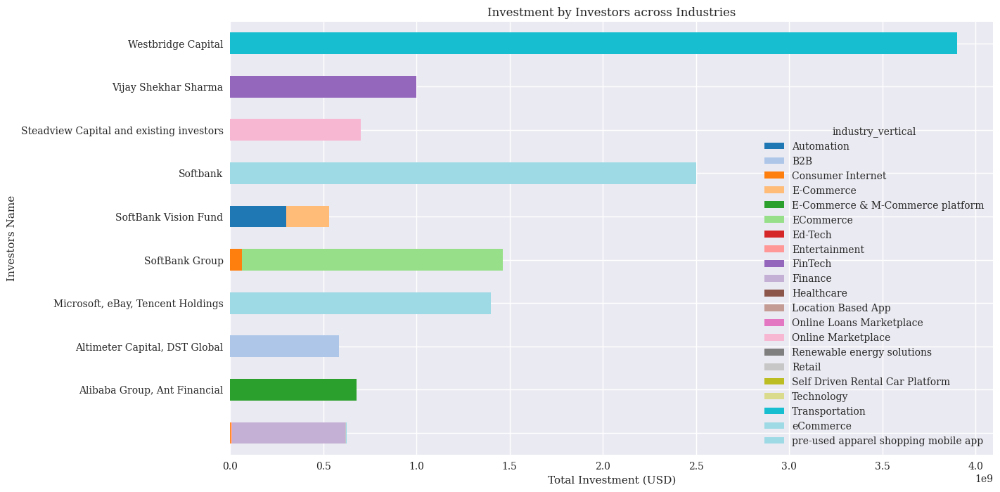

industry_vertical,Automation,B2B,Consumer Internet,E-Commerce,E-Commerce & M-Commerce platform,ECommerce,Ed-Tech,Entertainment,FinTech,Finance,Healthcare,Location Based App,Online Loans Marketplace,Online Marketplace,Renewable energy solutions,Retail,Self Driven Rental Car Platform,Technology,Transportation,eCommerce,pre-used apparel shopping mobile app
investors_name,,,,,,,,,,,,,,,,,,,,,
,0.0,0.0,4139811.0,2700000.0,0.0,0.000000e+00,46140.0,2500000.0,0.000000e+00,607050000.0,1000000.0,1000000.0,320000.0,0.0,500000.0,1600000.0,2000000.0,250000.0,0.000000e+00,0.000000e+00,1000000.0
"Alibaba Group, Ant Financial",0.0,0.0,0.0,0.0,680000000.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0
"Altimeter Capital, DST Global",0.0,585000000.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0
"Microsoft, eBay, Tencent Holdings",0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.400000e+09,0.0
SoftBank Group,0.0,0.0,62000000.0,0.0,0.0,1.400000e+09,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0
SoftBank Vision Fund,300000000.0,0.0,0.0,231000000.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0
Softbank,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,2.500000e+09,0.0
Steadview Capital and existing investors,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,700000000.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0
Vijay Shekhar Sharma,0.0,0.0,150000.0,0.0,0.0,0.000000e+00,0.0,0.0,1.000000e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0


In [134]:
# 1. Check columns to confirm the exact name
print(df_top_investors.columns)

# 2. (Optional) If the column has extra spaces, strip them
df_top_investors.columns = df_top_investors.columns.str.strip()

# 3. Make sure the column exists after cleaning
print('investors_name' in df_top_investors.columns)  # Should print True

# 4. Now create the pivot table using the correct column name
investor_industry = df_top_investors.pivot_table(
    index='investors_name',
    columns='industry_vertical',
    values='amount_in_usd',
    aggfunc='sum'
).fillna(0)

# 5. Show pivot table (optional)
print(investor_industry.head())

# 6. Plotting example - stacked horizontal bar chart of top investors by industry investments
investor_industry.plot(kind='barh', stacked=True, figsize=(14,8), colormap='tab20')
plt.title('Investment by Investors across Industries')
plt.xlabel('Total Investment (USD)')
plt.ylabel('Investors Name')
plt.show()

investor_industry


In [110]:
print(investor_industry.describe())
print(investor_industry.head())

industry_vertical    Automation           B2B  Consumer Internet  \
count              1.000000e+01  1.000000e+01       1.000000e+01   
mean               3.000000e+07  5.850000e+07       6.628981e+06   
std                9.486833e+07  1.849932e+08       1.949851e+07   
min                0.000000e+00  0.000000e+00       0.000000e+00   
25%                0.000000e+00  0.000000e+00       0.000000e+00   
50%                0.000000e+00  0.000000e+00       0.000000e+00   
75%                0.000000e+00  0.000000e+00       1.125000e+05   
max                3.000000e+08  5.850000e+08       6.200000e+07   

industry_vertical    E-Commerce  E-Commerce & M-Commerce platform  \
count              1.000000e+01                      1.000000e+01   
mean               2.337000e+07                      6.800000e+07   
std                7.295868e+07                      2.150349e+08   
min                0.000000e+00                      0.000000e+00   
25%                0.000000e+00           

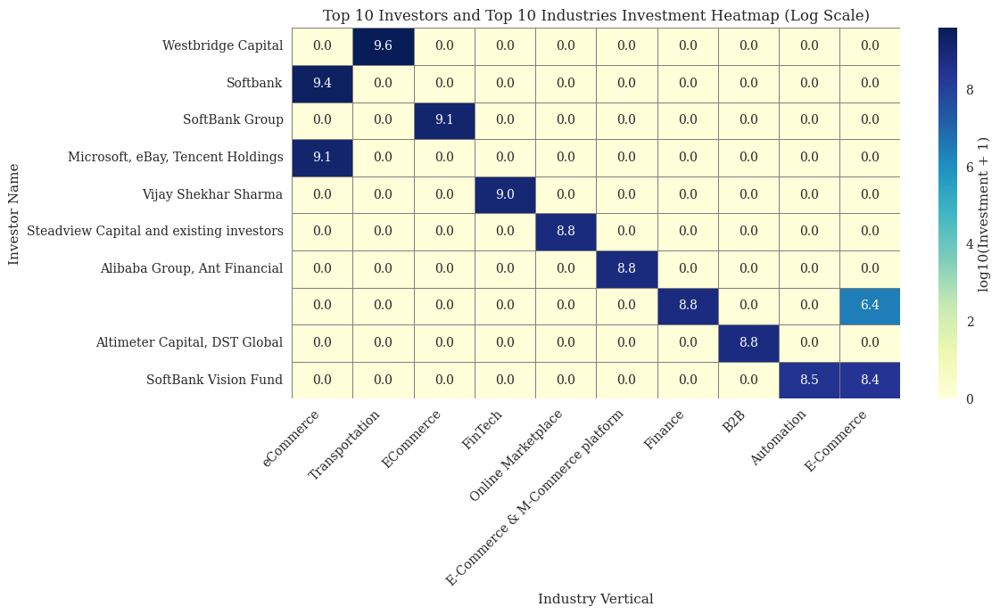

industry_vertical,eCommerce,Transportation,ECommerce,FinTech,Online Marketplace,E-Commerce & M-Commerce platform,Finance,B2B,Automation,E-Commerce
investors_name,,,,,,,,,,
Westbridge Capital,0.000000,9.591065,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Softbank,9.397940,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SoftBank Group,0.000000,0.000000,9.146128,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Microsoft, eBay, Tencent Holdings",9.146128,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Vijay Shekhar Sharma,0.000000,0.000000,0.000000,9.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Steadview Capital and existing investors,0.000000,0.000000,0.000000,0.0,8.845098,0.000000,0.000000,0.000000,0.000000,0.000000
"Alibaba Group, Ant Financial",0.000000,0.000000,0.000000,0.0,0.000000,8.832509,0.000000,0.000000,0.000000,0.000000
,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,8.783224,0.000000,0.000000,6.431364
"Altimeter Capital, DST Global",0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,8.767156,0.000000,0.000000


In [135]:
import numpy as np
# Sum of investments by investor
top_investors = investor_industry.sum(axis=1).sort_values(ascending=False).head(10).index

# Sum of investments by industry
top_industries = investor_industry.sum(axis=0).sort_values(ascending=False).head(10).index

filtered_data = investor_industry.loc[top_investors, top_industries]

# Apply log transform for visualization
log_filtered_data = np.log10(filtered_data + 1)

plt.figure(figsize=(12, 7))
sns.heatmap(
    log_filtered_data,
    cmap='YlGnBu',
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'log10(Investment + 1)'},
    annot=True,
    fmt='.1f'
)
plt.title('Top 10 Investors and Top 10 Industries Investment Heatmap (Log Scale)')
plt.ylabel('Investor Name')
plt.xlabel('Industry Vertical')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

log_filtered_data

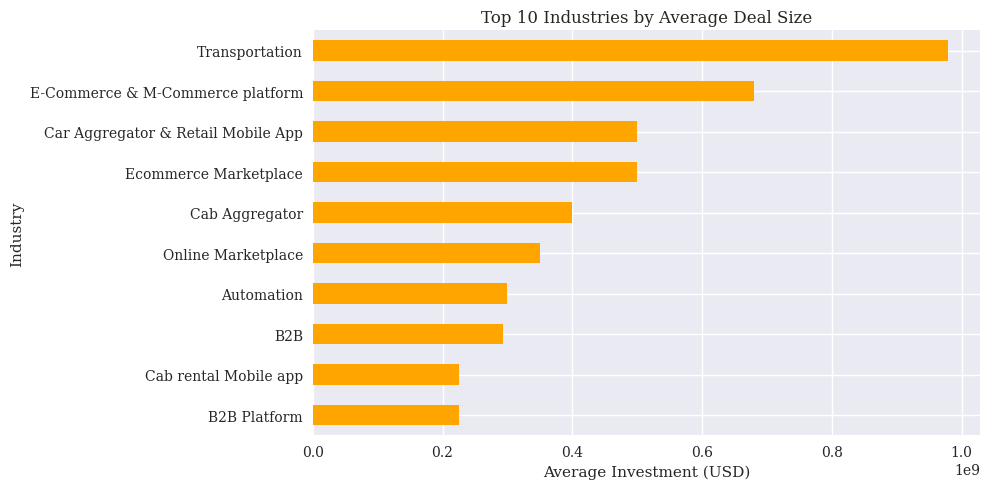

industry_vertical
Transportation                        979158098.5
E-Commerce & M-Commerce platform      680000000.0
Car Aggregator & Retail Mobile App    500000000.0
Ecommerce Marketplace                 500000000.0
Cab Aggregator                        400000000.0
Online Marketplace                    350071500.0
Automation                            300000000.0
B2B                                   293500000.0
Cab rental Mobile app                 225000000.0
B2B Platform                          225000000.0
Name: amount_in_usd, dtype: float64

In [136]:
top_n = 10
top_avg_deal_size = avg_deal_size.head(top_n)

plt.figure(figsize=(10,5))
top_avg_deal_size.plot(kind='barh', color='orange')  # horizontal bar chart
plt.title(f'Top {top_n} Industries by Average Deal Size')
plt.xlabel('Average Investment (USD)')
plt.ylabel('Industry')
plt.gca().invert_yaxis()  # largest bar at top
plt.tight_layout()
plt.show()

top_avg_deal_size